In [89]:
#importing neccessary libraries needed for the project
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  
import seaborn as sns 
import math

In [2]:
mock_census = pd.read_csv("census_12_2022.csv") #reads the data using pandas
mock_census   #displays the data

,Unnamed: 0,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
0,0,1,Scott Forks,Alice,Nicholson-Lowe,52,Head,Married,Female,Microbiologist,None,None
1,1,1,Scott Forks,Mitchell,Nicholson-Lowe,59,Husband,Married,Male,Homeopath,None,None
2,2,1,Scott Forks,Bernard,Nicholson-Lowe,14,Son,NaN,Male,Student,None,NaN
3,3,1,Scott Forks,Kieran,Nicholson-Lowe,13,Son,NaN,Male,Student,None,NaN
4,4,2,Scott Forks,Amy,Nicholls,41,Head,Married,Female,Publishing copy,None,Christian
...,...,...,...,...,...,...,...,...,...,...,...,...
9538,9538,1,Baker Rocks,Neil,Douglas,47,None,Single,male,Translator,None,None
9539,9539,1,Baker Rocks,Sylvia,Ali,34,None,Single,Female,"Engineer, drilling",None,Muslim
9540,9540,1,Baker Rocks,Janet,Wall,26,None,Single,Female,Musician,None,Christian
9541,9541,1,Baker Rocks,Jennifer,Matthews,53,None,Single,Female,Event organiser,None,Christian


In [3]:
# dropping the Unnamed column as it is not valuable in the analysis
mock_census = mock_census.drop('Unnamed: 0',axis=1)

In [4]:
mock_census.info() #this gives a brief description of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9543 entries, 0 to 9542
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   House Number                   9543 non-null   object
 1   Street                         9543 non-null   object
 2   First Name                     9543 non-null   object
 3   Surname                        9543 non-null   object
 4   Age                            9543 non-null   object
 5   Relationship to Head of House  9543 non-null   object
 6   Marital Status                 7350 non-null   object
 7   Gender                         9543 non-null   object
 8   Occupation                     9543 non-null   object
 9   Infirmity                      9543 non-null   object
 10  Religion                       7285 non-null   object
dtypes: object(11)
memory usage: 820.2+ KB


In [5]:
#checking null values

mock_census.isna().sum()


House Number                        0
Street                              0
First Name                          0
Surname                             0
Age                                 0
Relationship to Head of House       0
Marital Status                   2193
Gender                              0
Occupation                          0
Infirmity                           0
Religion                         2258
dtype: int64

In [6]:
mock_census.duplicated().sum()  #checking for duplicates rows in the census data

0

## Data Exploration of the Age Column

In [7]:
mock_census['Age'].unique() #checking for unique values

array(['52', '59', '14', '13', '41', '43', '12', '76', '78', '48', '20',
       '16', '8', '39', '6', '1', '65', '66', '29', '26', '73', '38',
       '31', '34', '3', '0', '60', '62', '25', '22', '18', '56', '53',
       '19', '75', '36', '42', '35', '23', '49', '27', '89', '86', '11',
       '54', '24', '44', '45', '51', '55', '47', '21', '57', '68', '72',
       '40', '33', '30', '63', '50', '4', '71', '85', '10', '67', '64',
       '32', '2', '9', '5', '61', '15', '17', '7', '58', '81', '74', '77',
       '46', '69', '80', '37', '28', '83', '79', '70', '92', '84', '93',
       '82', '79.77226286', '82.77226286', '87', '103', '95', '106', '88',
       '100', '91', '90.6967748', '96', '105', '94', '102', '104', '108',
       '90', 'twenty eight', '107', '98', ' ', '80.58881184', '97',
       '62.70684789', '61.70684789', '71.43034858', '72.43034858'],
      dtype=object)

In [8]:
mock_census.loc[mock_census['Age']=='twenty eight'] #this filters out the row with the string

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
4410,2,Collins Mountain,Harry,Winter,twenty eight,Head,Single,Male,Building surveyor,None,Methodist


In [9]:
mock_census.loc[4410, 'Age'] = '28' #converting the string in the age column to integer

In [10]:
#checks for the blank cell in the age column 

mock_census.loc[mock_census['Age']==' ']

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
6487,227,White Branch,Reece,Riley,,Son,NaN,Male,Child,None,NaN


In [11]:
mock_census.loc[6487, 'Age'] = '2' #fills with the average value of the child age

In [12]:
#floats in the age column will also be round down 

mock_census['Age']=mock_census['Age'].astype(float) #converts to float
mock_census['Age']=mock_census['Age'].apply(np.floor) #rounds  down the floats
mock_census['Age']=mock_census['Age'].astype(int)

In [13]:
#The empty cell will be filled with average age of all child in the data 

avrg= mock_census[mock_census['Occupation'] == "Child"]
avrg["Age"].mean() #this gets the average age of the child


2.2011605415860735

In [14]:

mock_census['Age'].unique() #inspecting the data again to ensure it's cleaned



array([ 52,  59,  14,  13,  41,  43,  12,  76,  78,  48,  20,  16,   8,
        39,   6,   1,  65,  66,  29,  26,  73,  38,  31,  34,   3,   0,
        60,  62,  25,  22,  18,  56,  53,  19,  75,  36,  42,  35,  23,
        49,  27,  89,  86,  11,  54,  24,  44,  45,  51,  55,  47,  21,
        57,  68,  72,  40,  33,  30,  63,  50,   4,  71,  85,  10,  67,
        64,  32,   2,   9,   5,  61,  15,  17,   7,  58,  81,  74,  77,
        46,  69,  80,  37,  28,  83,  79,  70,  92,  84,  93,  82,  87,
       103,  95, 106,  88, 100,  91,  90,  96, 105,  94, 102, 104, 108,
       107,  98,  97])

## Data Exploration of the House Number Column

In [15]:
mock_census['House Number'].unique() #checking the ditinct values in the column

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', 'Two', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33',
       '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44',
       '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55',
       '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66',
       '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77',
       '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88',
       '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99',
       '100', '101', '102', '103', '104', '105', '106', '107', '108',
       '109', '110', '111', '112', '113', '114', '115', '116', '117',
       '118', '119', '120', '121', '122', '123', '124', '125', '126',
       '127', '128', '129', '130', '131', '132', '133', '134', '135',
       '136', '137', '138', '139', '140', '141', '142', '143', '1

In [16]:
mock_census.loc[mock_census['House Number']=='Two'] #this filters out the row with the string


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
42,Two,Fish Lane,Gregory,Dixon,75,Head,Widowed,Male,Retired Barrister,None,Christian


In [17]:
mock_census.loc[42, 'House Number'] = '2' #replacing the string character with a number

In [18]:
mock_census['House Number']=mock_census['House Number'].astype(int) #this converts the datatype to integer

In [19]:
mock_census['House Number'].unique() #inspecting the cleaned data

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

## DATA EXPLORATION OF THE "FIRST NAME" COLUMN


In [20]:
mock_census['First Name'].unique() #inspecting the distinct values for inconsistency and errors


array(['Alice', 'Mitchell', 'Bernard', 'Kieran', 'Amy', 'Raymond',
       'Beverley', 'Brenda', 'Ryan', 'Megan', 'Arthur', 'Lee',
       'Christian', 'Lorraine', 'Stewart', 'Sheila', 'Claire', 'Tom',
       'Alex', 'Jenna', 'Abdul', 'Liam', 'Natalie', 'Ricky', 'Aaron',
       'Steven', 'Valerie', 'Albert', 'Reece', 'Debra', 'Catherine',
       'Paul', 'Irene', 'Nicole', 'Anna', 'Norman', 'Kathryn', 'Carl',
       'Lindsey', 'Gregory', 'Jordan', 'Leslie', 'Sylvia', 'Harry',
       'Yvonne', 'Barbara', 'Ann', 'Conor', 'Garry', 'Joseph', 'William',
       'Lauren', 'Lucy', 'Joe', 'Aimee', 'Billy', 'Charles', 'Naomi',
       'Alison', 'Kevin', 'Geraldine', 'Ronald', 'Hugh', 'Lynne', 'Barry',
       'Shannon', 'Leon', 'Eric', 'Ellie', 'Stephen', 'Leah', 'Paige',
       'Bryan', 'Francesca', 'Anthony', 'Shirley', 'Thomas', 'Kyle',
       'Kenneth', 'Denise', 'Gemma', 'Margaret', 'Carolyn', 'Howard',
       'Linda', 'Damian', 'Helen', 'Rachel', 'Frederick', 'Donald',
       'Lynn', 'Joel', 'E

In [21]:
mock_census.loc[mock_census['First Name']==' '] #checking for empty strings

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
405,7,Hartley Lodge,,Hall,3,Daughter,NaN,Female,Child,None,NaN
3677,40,Hughes Light,,Wright,23,Daughter,Single,Female,"Accountant, chartered public finance",None,Christian
4509,50,Bronze Rest,,Watkins,58,Head,Divorced,Male,Maintenance engineer,None,Christian


In [22]:
# i have further investigated and there's no way to know their first name from the dataset
# the empty cell in the First Name column will be replaced with unknown


mock_census['First Name'].replace(to_replace= [" "],value= ["Unknown"], inplace = True)

## DATA EXPLORATION OF THE "SURNAME" COLUMN

In [23]:
mock_census['Surname'].unique() #inspecting the distinct values for inconsistency and errors


array(['Nicholson-Lowe', 'Nicholls', 'Price', 'Singh', 'Connor-Singh',
       'Payne-Connor-Singh', 'Wood-Payne-Connor-Singh', 'Murphy', 'Smith',
       'Watts', 'Davies', 'Doherty', 'Bennett', 'Chapman', 'Robson',
       'Dixon', 'Gray', 'Potter', "O'Neill", 'Anderson', 'Morgan', 'Dean',
       'Bates', 'Miller', 'Barry', 'Foster', 'Browne', 'Mitchell',
       'Patel', 'Parker', 'Whitehead', 'Wilson', 'McDonald', 'Osborne',
       'Gallagher', 'McKenzie', 'Hughes', 'West', 'Harrison', 'Stephens',
       'Lawrence', 'Gardiner', 'Marsh', 'Bowen', 'Collins', 'Burgess',
       'Francis', 'Rees', 'Cooper', 'Johnson', 'Briggs', 'Thompson',
       'White', 'Henderson', 'Miles', 'Rogers', 'Townsend', 'Hurst',
       'Greenwood', 'Davey', 'Spencer', 'Hooper', 'Jackson',
       'Griffiths-Jackson', 'Clarke', 'Holt', 'Gibbons', 'Wood',
       'Marshall', 'Moran', 'Hall-Patel', 'Bryan', 'Andrews', 'Jones',
       'Armstrong', 'Gill', 'Hewitt', 'Mahmood', 'Austin-Wood',
       'Austin-Wood-Lloyd',

In [24]:
mock_census.loc[mock_census['Surname']==' '] #checking for empty cells

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
975,31,Newrywalk Drive,Lindsey,,52,Head,Married,Female,"Sales professional, IT",None,Christian
8265,27,Pilgrim Drive,Ellie,,2,Daughter,NaN,Female,Child,None,NaN


In [25]:
#i will check for relationships with other occupants living in the same street and house number

mock_census[(mock_census["House Number"] == 31) & (mock_census["Street"] == "Newrywalk Drive")]


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
975,31,Newrywalk Drive,Lindsey,,52,Head,Married,Female,"Sales professional, IT",None,Christian
976,31,Newrywalk Drive,Wayne,Williams,56,Husband,Married,Male,Training and development officer,None,Christian
977,31,Newrywalk Drive,Anne,Williams,16,Daughter,NaN,Female,Student,None,NaN


In [26]:
#replacing the blank cell with the surname as they are related

mock_census.loc[975, 'Surname'] = 'Williams'

In [27]:
#checking for similar relationship for the other blank cell

mock_census[(mock_census["House Number"] == 27) & (mock_census["Street"] == "Pilgrim Drive")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
8263,27,Pilgrim Drive,Howard,Hughes,43,Head,Married,Male,Radio broadcast assistant,None,Christian
8264,27,Pilgrim Drive,Susan,Hughes,38,Wife,Married,Female,Bonds trader,None,None
8265,27,Pilgrim Drive,Ellie,,2,Daughter,NaN,Female,Child,None,NaN
8266,27,Pilgrim Drive,Sharon,Hughes,0,Daughter,NaN,F,Child,None,NaN


In [28]:
#replacing the blank cell with the surname as they are related

mock_census.loc[8265, 'Surname'] = 'Hughes'

In [29]:
#the surnames of the same family have inconsistencies in the column 
#investigate further if there's need to make the name consistent or it doesn't affect your analysis    

surname_check = mock_census.sort_values(by=['Street', 'House Number'], ascending = [True, True]) #this sorts the column
with pd.option_context('display.max_rows', None, 'display.max_columns', None): #displays the entire data without limit
    display(surname_check)


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
7201,1,Adams Mews,Dorothy,Saunders,31,Head,Single,Female,Lawyer,None,None
7202,1,Adams Mews,Charlie,Barrett,37,Partner,Single,Male,"Engineer, building services",None,None
7203,1,Adams Mews,Kieran,Saunders,1,Son,NaN,Male,Child,None,NaN
7204,1,Adams Mews,Iain,Stokes,44,Lodger,Single,Male,Purchasing manager,None,Christian
7205,2,Adams Mews,Caroline,Berry,41,Head,Single,Female,"Psychologist, occupational",None,Catholic
7206,2,Adams Mews,Leonard,Smith,45,Partner,Single,Male,Counsellor,None,None
7207,3,Adams Mews,Ashley,Thompson,52,Head,Single,Male,Personnel officer,None,Sikh
7208,3,Adams Mews,Carol,Smith,52,Partner,Single,Female,Production manager,None,Sikh
7209,4,Adams Mews,Martyn,Smith,79,Head,Married,Male,Retired Dentist,None,Christian
7210,4,Adams Mews,Valerie,Smith,74,Wife,Married,Female,Unemployed,None,Christian


#### After inspecting the surname column, inoticed some surnames of the same family are not consistent. 
#### reason could be that some have decided to keep their last name after marraige and just add the family name to their last name
#### This has no impact in the census data since there are no spelling errors and won't  affect the result of the analysis

## Data Exploration of the Relationship to head of house column

In [30]:
mock_census['Relationship to Head of House'].unique() #checking the unique entries

array(['Head', 'Husband', 'Son', 'Daughter', 'Visitor', 'Wife', 'Cousin',
       'None', 'Partner', 'Granddaughter', 'Lodger', 'Nephew', 'Sibling',
       'Neice', 'Grandson', 'Adopted Son', 'Adopted Daughter', 'Step-Son',
       'Step-Daughter', 'Adopted Grandson', 'Adopted Granddaughter'],
      dtype=object)

In [31]:
mock_census['Relationship to Head of House'].isnull().unique() #checking for empty cells

array([False])

## Data Exploration of Marital Status Column 

In [32]:
mock_census['Marital Status'].unique() #checking for unique entries

array(['Married', nan, 'Widowed', 'Single', 'Divorced', 'S', 'D', 'M',
       'W'], dtype=object)

In [33]:
null_value = mock_census[mock_census['Marital Status'].isnull()] #checking for nan values in religion 
with pd.option_context('display.max_rows', None, 'display.max_columns', None): #displays the whole dataset without truncating
    display(null_value)


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
2,1,Scott Forks,Bernard,Nicholson-Lowe,14,Son,NaN,Male,Student,None,NaN
3,1,Scott Forks,Kieran,Nicholson-Lowe,13,Son,NaN,Male,Student,None,NaN
6,2,Scott Forks,Beverley,Nicholls,12,Daughter,NaN,Female,Student,None,NaN
11,4,Scott Forks,Lee,Singh,16,Son,NaN,Male,Student,None,NaN
12,4,Scott Forks,Christian,Connor-Singh,16,Son,NaN,Male,Student,None,NaN
13,4,Scott Forks,Lorraine,Payne-Connor-Singh,14,Daughter,NaN,Female,Student,None,NaN
14,4,Scott Forks,Stewart,Wood-Payne-Connor-Singh,8,Son,NaN,Male,Student,None,NaN
16,5,Scott Forks,Claire,Murphy,6,Daughter,NaN,Female,Student,None,NaN
17,5,Scott Forks,Tom,Murphy,1,Son,NaN,Male,Child,None,NaN
29,8,Scott Forks,Reece,Doherty,3,Son,NaN,Male,Child,None,NaN


In [34]:
#i will make all abbreviated values unique by replacing with full name

mock_census['Marital Status'].replace('S', 'Single',inplace=True)
mock_census['Marital Status'].replace('D', 'Divorced',inplace=True)
mock_census['Marital Status'].replace('M', 'Married', inplace=True)
mock_census['Marital Status'].replace('W', 'Widowed', inplace=True)

In [35]:
#replacing NaN values for under 16 with 'minors'


mock_census['Marital Status'] = np.where(
   (mock_census['Marital Status'].isnull()) & (mock_census["Age"] < 16) , 'Minors', mock_census['Marital Status']
)

In [36]:
#Checking for NaN values that are above 16 years

mock_census[(mock_census["Marital Status"].isnull()) & (mock_census["Age"] >=16)]


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
11,4,Scott Forks,Lee,Singh,16,Son,NaN,Male,Student,None,NaN
12,4,Scott Forks,Christian,Connor-Singh,16,Son,NaN,Male,Student,None,NaN
36,9,Scott Forks,Anna,Bennett,16,Daughter,NaN,Female,Student,None,NaN
126,7,Buckley Road,Ellie,Marshall,16,Daughter,NaN,Female,Student,None,NaN
170,7,Capricorn Road,Colin,Cook,17,Son,NaN,Male,Student,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
9456,1,Wilkinson Hall,Neil,Smith,17,Son,NaN,Male,Student,None,NaN
9457,1,Wilkinson Hall,Denis,Smith,16,Son,NaN,Male,Student,None,NaN
9475,1,Johnson Abbey,Margaret,Smith,16,Daughter,NaN,Female,Student,None,NaN
9481,1,Tiger Haven,Owen,Smith,16,Son,NaN,Male,Student,None,NaN


In [37]:
#the NaN entries of age 16 and above are replaced with 'single'
mock_census['Marital Status'] = np.where(
   (mock_census['Marital Status'].isnull()) & (mock_census["Age"] >= 16) , 'Single', mock_census['Marital Status']
)

In [38]:
#checking for inconsistencies since all age below 16 are made 'minors'
mock_census[(mock_census["Marital Status"]=='Single') & (mock_census["Age"] < 16)]
mock_census[(mock_census["Marital Status"]=='Widowed') & (mock_census["Age"] < 16)]
mock_census[(mock_census["Marital Status"]=='Married') & (mock_census["Age"] < 16)]
mock_census[(mock_census["Marital Status"]=='Divorced') & (mock_census["Age"] < 16)]


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion


In [39]:
mock_census['Marital Status'].unique() #confirming the unique values 

array(['Married', 'Minors', 'Widowed', 'Single', 'Divorced'], dtype=object)

## Data Exploration of Gender Column

In [40]:
mock_census['Gender'].unique() #checking for unique entry

array(['Female', 'Male', 'M', 'male', 'F', 'female', 'f', 'm', ' '],
      dtype=object)

In [41]:
mock_census.loc[mock_census['Gender']==' '] #displays null value

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
8713,15,Spencer Avenue,Mary,Brooks,58,Head,Single,,Unemployed,None,Christian


In [42]:
#to further investigate the gender, i will check to see if there's someone with the same address
# from the name 'Mary', it is easy to determine the gender
# the person also have a son to back up the claim

mock_census[(mock_census["House Number"] == 15) & (mock_census["Street"] == "Spencer Avenue")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
8713,15,Spencer Avenue,Mary,Brooks,58,Head,Single,,Unemployed,None,Christian
8714,15,Spencer Avenue,Tony,Brooks,41,Son,Single,Male,Rural practice surveyor,None,Christian


In [43]:
mock_census.loc[8713, 'Gender'] = 'Female'


In [44]:
#i will make the values unique for the gender column

sex = {'f': 'Female','F':'Female', 'male': 'Male', 'M': 'Male', 'm': 'Male','female':'Female'} #replaces the values
mock_census['Gender'].replace(sex, inplace=True)

In [45]:
mock_census['Gender'].unique() #confirming the unique values

array(['Female', 'Male'], dtype=object)

## Data Exploration of Occupation Column

In [46]:
list(mock_census['Occupation'].unique()) #checking for unique entries


['Microbiologist',
 'Homeopath',
 'Student',
 'Publishing copy',
 'Chemical engineer',
 'Retired Catering manager',
 'Retired Editor, magazine features',
 'Community arts worker',
 'University Student',
 'Unemployed',
 'Child',
 'Lawyer',
 'Engineer, maintenance',
 'Physiological scientist',
 'Engineer, chemical',
 'Pensions consultant',
 'Retired Doctor, hospital',
 'Immunologist',
 'Trade mark attorney',
 'Field trials officer',
 'Human resources officer',
 'Banker',
 'Engineering geologist',
 'Surveyor, planning and development',
 'Commercial art gallery manager',
 'Tour manager',
 'Patent attorney',
 'Chief Financial Officer',
 'Advice worker',
 'Retired Barrister',
 'Metallurgist',
 'Physicist, medical',
 'Psychologist, occupational',
 'Manufacturing engineer',
 'Psychologist, clinical',
 'Engineer, civil (consulting)',
 'Agricultural engineer',
 'Estate manager/land agent',
 'Set designer',
 'Forest/woodland manager',
 'Retired Merchant navy officer',
 'Retired Medical technical 

In [47]:
mock_census.loc[mock_census['Occupation']==' '] #checking for empty strings

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
5688,6,Elyarch Drive,Toby,Richardson,42,Lodger,Single,Male,,None,Christian


In [48]:
#i will drop this row as there isn't sufficent data to know his occupation
#the row has no effect in the analysis that wil be carried out


mock_census.drop([5688], axis=0, inplace=True) #drops the index with null value

In [49]:
#making all occupation that has retired in it one unique entry
mock_census.loc[mock_census['Occupation'].str.contains('Retired'),'Occupation']='Retired'


In [50]:
#defining a function that returns the unique entries when called

def occup_group(data):
    x = np.array([])
    for i in data['Occupation']:
        if i == 'Retired':
            i = 'Retired'
        elif i =='Student':
            i = 'Student'
        elif i == 'University Student':
            i = 'University Student'
        elif i == 'PhD Student':
            i = 'PhD Student'
        elif i == 'Child':
            i = 'Child'
        elif i =='Unemployed':
            i = 'Unemployed'
        else:
            i = "Employed"
        x = np.append(x,i)
    return x

In [51]:
mock_census['Occupation_group'] = occup_group(mock_census) #creates a new column
mock_census

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
0,1,Scott Forks,Alice,Nicholson-Lowe,52,Head,Married,Female,Microbiologist,None,None,Employed
1,1,Scott Forks,Mitchell,Nicholson-Lowe,59,Husband,Married,Male,Homeopath,None,None,Employed
2,1,Scott Forks,Bernard,Nicholson-Lowe,14,Son,Minors,Male,Student,None,NaN,Student
3,1,Scott Forks,Kieran,Nicholson-Lowe,13,Son,Minors,Male,Student,None,NaN,Student
4,2,Scott Forks,Amy,Nicholls,41,Head,Married,Female,Publishing copy,None,Christian,Employed
...,...,...,...,...,...,...,...,...,...,...,...,...
9538,1,Baker Rocks,Neil,Douglas,47,None,Single,Male,Translator,None,None,Employed
9539,1,Baker Rocks,Sylvia,Ali,34,None,Single,Female,"Engineer, drilling",None,Muslim,Employed
9540,1,Baker Rocks,Janet,Wall,26,None,Single,Female,Musician,None,Christian,Employed
9541,1,Baker Rocks,Jennifer,Matthews,53,None,Single,Female,Event organiser,None,Christian,Employed


In [52]:
#getting the total population to get the sample crude birth and death rate

total_population=len(mock_census)
total_population

9542

In [53]:
babies0=mock_census['Age']==0 #assigning newborn to a variable

In [54]:
#gets the total newborns of the population per thousand
babies0 = mock_census['Age'] == 0
babies4 = mock_census['Age'] == 4



crudebr = (round(len(mock_census[babies0])/total_population,3))*1000 

crudebr4year = (round(len(mock_census[babies4])/total_population,3))*1000

print(f"Present Crude Birthrate per 1000: {crudebr}")
print(f"Previous Crude Birthrate per 1000: {crudebr4year}")


print(f"Present CBR Change from Previous per 1000: {crudebr-crudebr4year}")

Present Crude Birthrate per 1000: 9.0
Previous Crude Birthrate per 1000: 13.0
Present CBR Change from Previous per 1000: -4.0


In [55]:
 #analyzing death rate for the last 10years range

death_90 = len(mock_census.loc[mock_census["Age"]==90])
death_89 = len(mock_census.loc[mock_census["Age"]==89])
death_88 = len(mock_census.loc[mock_census["Age"]==88])
death_87 = len(mock_census.loc[mock_census["Age"]==87])
death_86 = len(mock_census.loc[mock_census["Age"]==86])
death_85 = len(mock_census.loc[mock_census["Age"]==85])
death_84 = len(mock_census.loc[mock_census["Age"]==84])
death_83 = len(mock_census.loc[mock_census["Age"]==83])
death_82 = len(mock_census.loc[mock_census["Age"]==82])
death_81 = len(mock_census.loc[mock_census["Age"]==81])
                               
Death_rate = [death_90, death_89, death_88, death_87, death_86,death_85,death_84,death_83,death_82,death_81]


print(f"Death rate: {Death_rate}")

Death rate: [7, 16, 14, 14, 19, 20, 22, 35, 31, 33]


## Data Exploration of Infirmity Column

In [56]:
list(mock_census['Infirmity'].unique()) #checking for unique values in the column

['None',
 'Mental Disability',
 'Physical Disability',
 'Unknown Infection',
 ' ',
 'Blind',
 'Deaf',
 'Disabled']

In [57]:
mock_census.loc[mock_census['Infirmity']==' '] #displaying all cells with the empty cells

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
559,19,Bumblebee Lane,Guy,Wallis,43,Husband,Married,Male,Licensed conveyancer,,Catholic,Employed
1088,19,Salmon Street,Kim,Gould,15,Daughter,Minors,Female,Student,,NaN,Student
1468,28,Keeper Street,Benjamin,Hale,3,Son,Minors,Male,Child,,NaN,Child
3383,25,Tamarisk Pines,Pamela,Knowles,62,Lodger,Single,Female,Garment/textile technologist,,Christian,Employed
4376,19,Sutton Drive,Jemma,Johnston,44,Head,Single,Female,Ophthalmologist,,None,Employed
5756,16,Elyarch Drive,Frederick,Gilbert,75,Husband,Married,Male,Retired,,None,Retired
6355,145,White Branch,Paige,Price,6,Daughter,Minors,Female,Student,,NaN,Student
6411,179,White Branch,Patrick,Greenwood,34,Head,Single,Male,Art therapist,,None,Employed
6900,2,Gray Ways,Donna,Turnbull,7,Daughter,Minors,Female,Student,,NaN,Student
7126,22,Anvil Street,Duncan,Oliver,25,Son,Single,Male,Occupational therapist,,Christian,Employed


In [58]:
#the empty cells will be replaced with none as it is the mode of the infirmity



mock_census['Infirmity'].replace(to_replace= [" "],value= ["None"], inplace = True) #filling the empty values with None

In [59]:
list(mock_census['Infirmity'].unique()) #confirming that the empty cells have been filled with 'None'

['None',
 'Mental Disability',
 'Physical Disability',
 'Unknown Infection',
 'Blind',
 'Deaf',
 'Disabled']

## Data Exploration of Religion Column

In [60]:
list(mock_census['Religion'].unique()) #checking for unique values in the dataset

['None',
 nan,
 'Christian',
 'Catholic',
 'Muslim',
 'Methodist',
 'Jewish',
 'Sikh',
 'Nope',
 'Undecided',
 'Jedi',
 'Orthodoxy',
 'Pagan',
 'Agnostic',
 'Housekeeper']

In [61]:
null_value = mock_census[mock_census['Religion'].isnull()] #checking for null values in religion 
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  #displays the data without truncating
    display(null_value)

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
2,1,Scott Forks,Bernard,Nicholson-Lowe,14,Son,Minors,Male,Student,None,NaN,Student
3,1,Scott Forks,Kieran,Nicholson-Lowe,13,Son,Minors,Male,Student,None,NaN,Student
6,2,Scott Forks,Beverley,Nicholls,12,Daughter,Minors,Female,Student,None,NaN,Student
11,4,Scott Forks,Lee,Singh,16,Son,Single,Male,Student,None,NaN,Student
12,4,Scott Forks,Christian,Connor-Singh,16,Son,Single,Male,Student,None,NaN,Student
13,4,Scott Forks,Lorraine,Payne-Connor-Singh,14,Daughter,Minors,Female,Student,None,NaN,Student
14,4,Scott Forks,Stewart,Wood-Payne-Connor-Singh,8,Son,Minors,Male,Student,None,NaN,Student
16,5,Scott Forks,Claire,Murphy,6,Daughter,Minors,Female,Student,None,NaN,Student
17,5,Scott Forks,Tom,Murphy,1,Son,Minors,Male,Child,None,NaN,Child
29,8,Scott Forks,Reece,Doherty,3,Son,Minors,Male,Child,None,NaN,Child


In [62]:
#the Nope values will be replaced with None for consistency


mock_census['Religion'].replace(to_replace= ["Nope"],value= ["None"], inplace = True)

In [63]:
mock_census.loc[mock_census['Religion']=='Housekeeper'] #displays role with the entry

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
7623,50,Canary Avenue,Ruth,Byrne,26,Head,Married,Female,"Engineer, electrical",None,Housekeeper,Employed


In [64]:
#filling the housekeeper religion column with None as there's no such religion

mock_census.loc[7623, 'Religion'] = 'None'



In [65]:
#Those under 18 probably haven't decided on their religion
#Those other groups with empty values for their cell are just 18 and probably still haven't decided


mock_census['Religion'] = np.where(
   (mock_census['Religion'].isnull()) , 'None', mock_census['Religion']
   )

In [66]:
#replacing the undecided values with None 
#undecided means they still don't have religion, to make my variables more unique, i will replace with None

mock_census.loc[mock_census['Religion']=='Undecided']

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
2058,30,Testament Street,Stacey,Walton,19,Head,Single,Female,University Student,None,Undecided,University Student
3740,9,Outer Drive,Brian,Sutton,74,Head,Married,Male,Retired,None,Undecided,Retired


In [67]:
#this replaces the value with None
mock_census['Religion'] = np.where(
   (mock_census['Religion'] == 'Undecided') , 'None', mock_census['Religion']
   )

In [68]:
#thr 'jedi' value isn't a religion in the UK, i will replace this with None

mock_census.loc[mock_census['Religion']=='Jedi']

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Occupation_group
3175,4,Coronation Avenue,Jay,Parker,39,Head,Single,Male,Production engineer,None,Jedi,Employed


In [69]:
mock_census['Religion'] = np.where(
   (mock_census['Religion'] == 'Jedi') , 'None', mock_census['Religion'] #replacing with None
   )

In [70]:
list(mock_census['Religion'].unique()) #confirming unique values in the dataset

['None',
 'Christian',
 'Catholic',
 'Muslim',
 'Methodist',
 'Jewish',
 'Sikh',
 'Orthodoxy',
 'Pagan',
 'Agnostic']

In [71]:
#checking the total count for all Religion

mock_census['Religion'].value_counts()

None         5435
Christian    2171
Catholic     1043
Methodist     671
Muslim        124
Sikh           56
Jewish         37
Orthodoxy       2
Agnostic        2
Pagan           1
Name: Religion, dtype: int64

In [72]:
mock_census.info() #prints the dataset information

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9542
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   House Number                   9542 non-null   int32 
 1   Street                         9542 non-null   object
 2   First Name                     9542 non-null   object
 3   Surname                        9542 non-null   object
 4   Age                            9542 non-null   int32 
 5   Relationship to Head of House  9542 non-null   object
 6   Marital Status                 9542 non-null   object
 7   Gender                         9542 non-null   object
 8   Occupation                     9542 non-null   object
 9   Infirmity                      9542 non-null   object
 10  Religion                       9542 non-null   object
 11  Occupation_group               9542 non-null   object
dtypes: int32(2), object(10)
memory usage: 1.1+ MB


In [73]:
#getting a count of hosehold occupancy

mock_census_occupancy = mock_census.groupby(['Street','House Number']).size().reset_index(name='counts')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(mock_census_occupancy)

                   Street  House Number  counts
0              Adams Mews             1       4
1              Adams Mews             2       2
2              Adams Mews             3       2
3              Adams Mews             4       2
4              Adams Mews             5       1
5              Adams Mews             6       5
6              Adams Mews             7       5
7              Adams Mews             8       1
8              Adams Mews             9       1
9              Adams Mews            10       4
10             Adams Mews            11       1
11             Adams Mews            12       4
12             Adams Mews            13       2
13             Adams Mews            14       4
14             Adams Mews            15       4
15             Adams Mews            16       2
16             Adams Mews            17       2
17             Adams Mews            18       5
18             Adams Mews            19       5
19             Adams Mews            20 

In [74]:
mock_census_occupancy.describe().round() #summarizes the household occupancy

,House Number,counts
count,3332.0,3332.0
mean,34.0,3.0
std,40.0,2.0
min,1.0,1.0
25%,10.0,1.0
50%,22.0,2.0
75%,41.0,4.0
max,244.0,22.0


# DATA VISUALIZATION

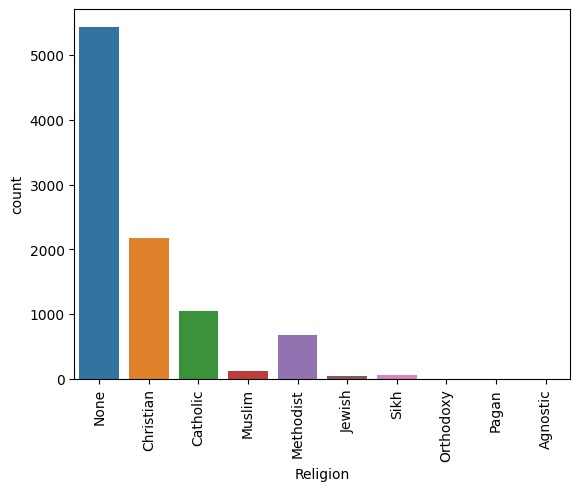

In [75]:
#visualization of the population by Religion

sns.countplot(x='Religion', data=mock_census)
plt.xticks(rotation=90) #this rotates the label on the x-axis to avoid overlapping
plt.savefig("Count of Religion.png")

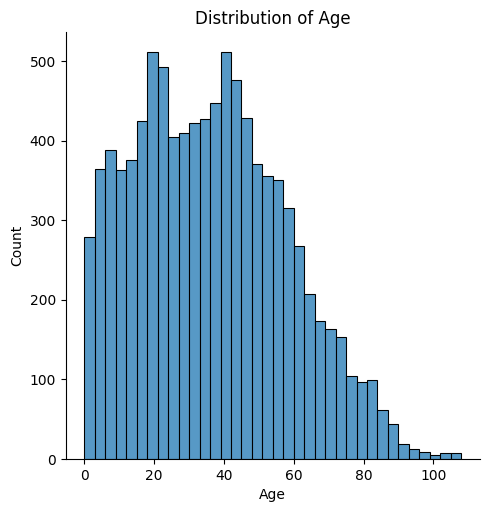

In [76]:
#getting the distribution of age
age_distribution=sns.displot(data=mock_census,x='Age')
plt.title('Distribution of Age')
plt.savefig("Distribution of Age.png")

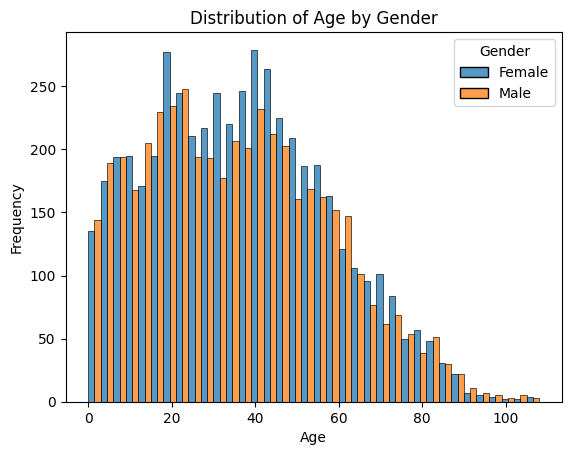

<Figure size 640x480 with 0 Axes>

In [77]:
#displaying the distribution of age by gender

sns.histplot(data=mock_census, x='Age', hue='Gender', multiple="dodge")
plt.ylabel('Frequency')
plt.title('Distribution of Age by Gender')
plt.show()
plt.savefig("Distribution of Age by Gender.png")

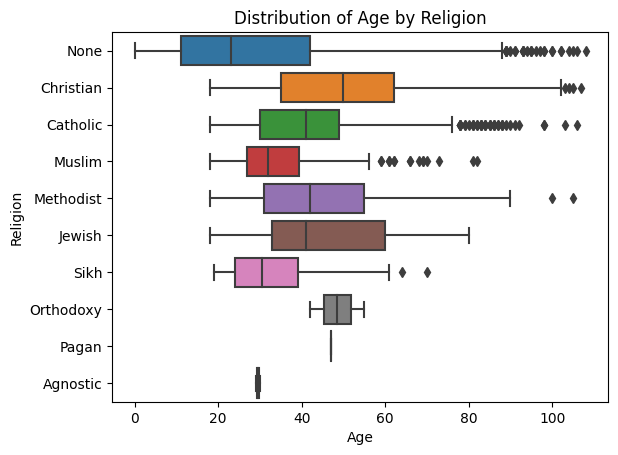

In [78]:
#displaying the visualization of religion by Age
sns.boxplot(data=mock_census, x='Age',  y='Religion')
plt.title('Distribution of Age by Religion')
plt.savefig("Distribution of Age by Religion.png")


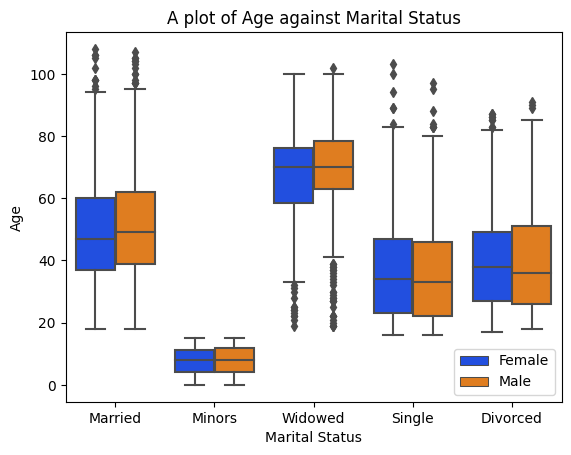

In [79]:
sns.boxplot(x="Marital Status",y="Age",data=mock_census, hue="Gender", palette="bright")
plt.title("A plot of Age against Marital Status") #sets the title
plt.legend(loc='lower right') #puts the position of the legend on the lower right
plt.savefig("plot of Age against Marital Status.png")

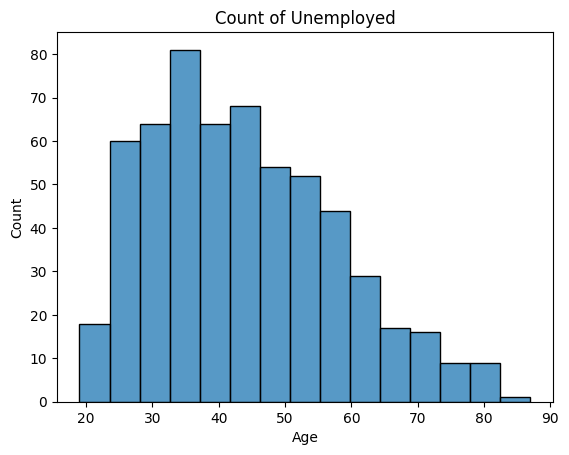

In [80]:
#Count of employment by Age

unemployment = mock_census[(mock_census["Occupation_group"]=='Unemployed')].value_counts()

sns.histplot(data=unemployment, x='Age')
plt.title('Count of Unemployed')
plt.savefig("Count of Unemployed.png")


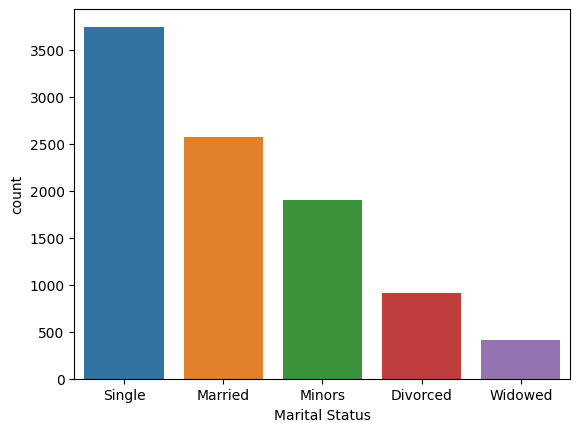

<Figure size 640x480 with 0 Axes>

In [81]:
#count of the population marital status

sns.countplot(x = 'Marital Status',
              data = mock_census,
              order = mock_census['Marital Status'].value_counts().index)
plt.show()
plt.savefig("Count of Marital Status.png")

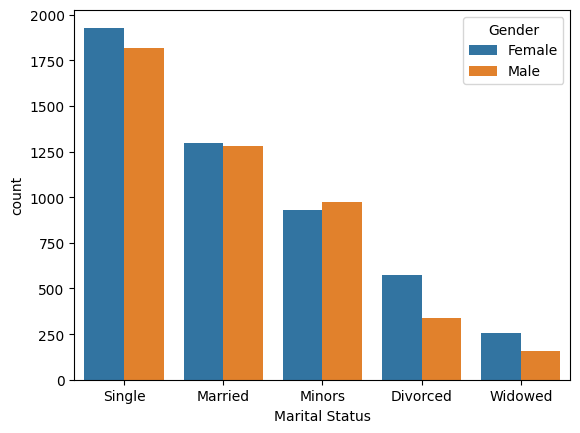

<Figure size 640x480 with 0 Axes>

In [82]:
#displaying marital status by gender

sns.countplot(x = 'Marital Status',
              data = mock_census,
              hue ='Gender',
              order = mock_census['Marital Status'].value_counts().index)
plt.show()
plt.savefig("Count of Marital Status by Gender.png")

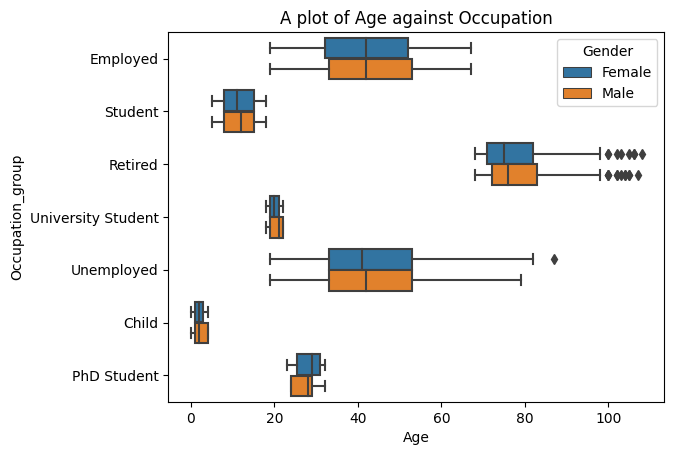

In [83]:
sns.boxplot(x="Age",y="Occupation_group",data=mock_census, hue="Gender")
plt.title("A plot of Age against Occupation") #sets the title
plt.savefig("Plot of Occupation by Age.png") #saves the graph

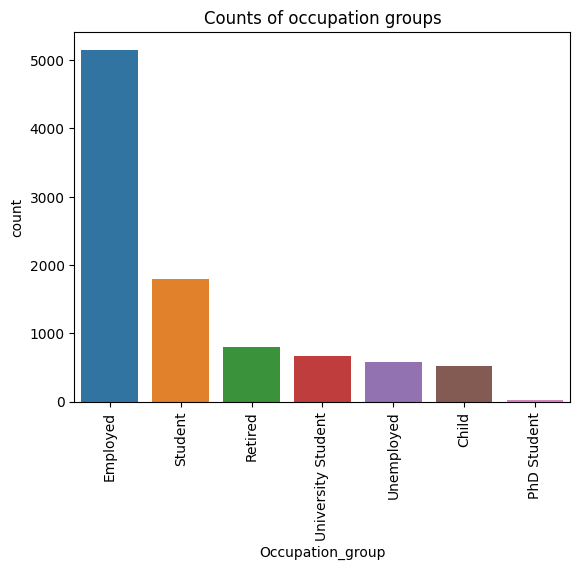

<Figure size 640x480 with 0 Axes>

In [84]:
#visualization to compare the occupation goups

sns.countplot(x = 'Occupation_group', data = mock_census)
order = mock_census['Occupation_group'].value_counts().index
plt.xticks(rotation=90)
plt.title("Counts of occupation groups")
plt.show()
plt.savefig("Count of occupation Groups.png") #saves the graph

In [85]:
#calculating the age distribution

def age_range_builder(mock_census,gender,start_age,end_age):
    return mock_census[(mock_census["Gender"]==gender) & (mock_census["Age"]>= start_age)&(mock_census["Age"]<=end_age)].count()["Gender"]

In [86]:
#grouping the age into groups

Age_range=["100+","95-99","90-94","85-89","80-84","75-79","70-74","65-69","60-64","55-59","50-54","45-49","40-44","35-39","30-34","25-29","20-24","15-19","10-14","5-9","0-4"]

male=[]
female=[]
count=[]

for value in Age_range:
    start=0
    end=0
    if "-" in value:
        age=value.split("-")
        start= int(age[0])
        end=int(age[1])
    else:
        start=100
        end=200
        
    male.append(-1*age_range_builder(mock_census, "Male",start,end))
    female.append(age_range_builder(mock_census, "Female",start,end))
    count.append((age_range_builder(mock_census, "Male",start,end))+(age_range_builder(mock_census, "Female",start,end)))
    
agegroup_table=pd.DataFrame({"Age":Age_range,"Male":male,"Female":female,"Count":count})
AgeClass=["100+","95-99","90-94","85-89","80-84","75-79","70-74","65-69","60-64","55-59","50-54","45-49","40-44","35-39","30-34","25-29","20-24","15-19","10-14","5-9","0-4"]

agegroup_table

,Age,Male,Female,Count
0,100+,-11,8,19
1,95-99,-8,5,13
2,90-94,-15,11,26
3,85-89,-42,41,83
4,80-84,-75,79,154
5,75-79,-79,88,167
6,70-74,-117,152,269
7,65-69,-113,148,261
8,60-64,-226,208,434
9,55-59,-267,287,554


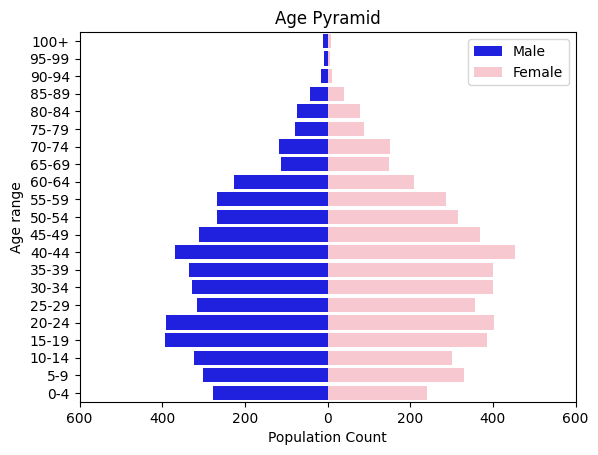

In [87]:
#displaying the age pyramid

age_pyramid=sns.barplot(x='Male',y='Age',data=agegroup_table,order=AgeClass,color=('blue'),label='Male')
age_pyramid=sns.barplot(x='Female',y='Age',data=agegroup_table,order=AgeClass,color=('pink'),label='Female')
age_pyramid.legend()
age_pyramid.set_xlabel('Population Count')
age_pyramid.set_ylabel('Age range')
plt.title('Age Pyramid')
xticks=plt.gca().get_xticks().astype(int)
plt.xticks(xticks,labels=np.abs(xticks));
plt.savefig("Age Pyramid.png") #saves the graph

In [88]:
#this gets the summary profile of the cleaned dataset

from pandas_profiling import ProfileReport

profile = ProfileReport(mock_census, title='Mock Census', explorative = True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]